# 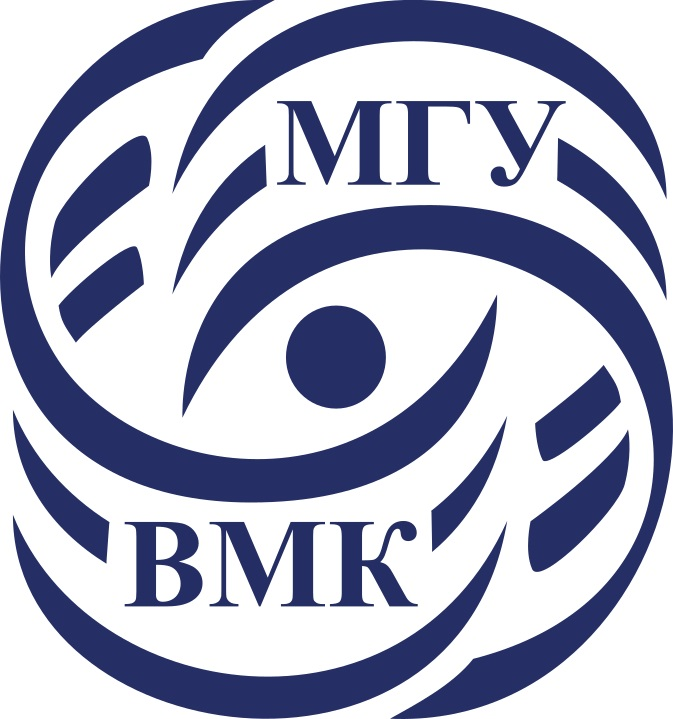

# Машинное обучение. ВМК МГУ

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# Практическое задание 12: Кластеризация. Методы снижения размерности.





## Уровень: <font color='SkyBlue'>**Базовый (Base)**</font>

# О формате сдачи

🔷 **<font color='plum'>При решении ноутбука используйте данный шаблон</font>**

    ✅ Можно добавлять новые ячейки любых типов
    ❌ Не нужно удалять текстовые ячейки c разметкой частей ноутбука и формулировками заданий


🔷 **<font color='plum'>При оценивании задач учитывается код</font>**

    ✅ Задания, в которых необходим код, обычно помечаются фразами "Your code here"/"Ваш код" и аналогичными
    ❌ Ответы на вопросы без сопутствующего кода оцениваются в 0 баллов
    ❌ Наличе работоспособного кода в ноутбуке, если на сказано иного, обязательно

🔷 **<font color='plum'>При оценивании задач учитываются выводы</font>**

    ✅ Задания, в которых необходимы выводы, обычно помечаются фразами Вывод"/"Ответ на вопрос"/"Ваш текст" и аналогичными
    ✅ Обычно выводы подразумевают под собой текстовый ответ (можно писать markdown, latex).
    ✅ Сопутствующие изображения, графики, таблички - приветствуются!
    ❌ При отсутствии выводов задание не засчитается на полный балл

-----------
<font color="white" style="opacity:0.2024"></font>







__В этом задании вы..:__

* Познакомитесь с одним способом визуализации процесса обучения
* Сравните между собой результаты разных способов кластеризации
* Посмотрите и реализуете несколько метрик качества кластеризации
* Попробуете разные методы снижения размерности

----

<font color="white" style="opacity:0.2024"></font>
<font color=DarkOrange>**Примерное время выполнения (execution time/время выполнения, если нажать run all) всех ячеек ноутбука при правильной реализации: 30 минут </font>**

----------------------------------------------
<font color="white" style="opacity:0.2023"></font>

Перед началом выполнения переведите ноутбук в `Доверенный режим` (`Trusted`) для корректного отображения изображений:

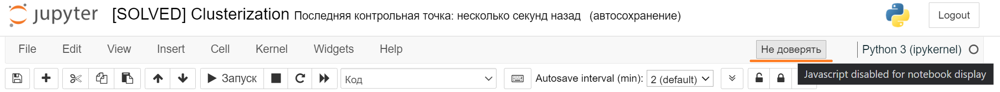

In [1]:
%config Completer.use_jedi = False
%load_ext autoreload
%autoreload 2

----------------------------------------------
<font color="white" style="opacity:0.2023"></font>

# Подготовка рабочей среды

Сначала установим нужные нам версии библиотек. Мы гарантируем, что в данных версиях задание будет корректно отрабатывать.

После установки нужных версий, **возможно,** нужно перезагрузить среду (runtime), но скорее всего вам это не понадобится


На скачивание файла и установку понадобится не более 5 минут.

<font color='OrangeRed'>**Важно!**</font>

Устанавливать нужные версии нужно каждый раз, когда создается новый рантайм. Например, если вы 2 часа подряд делаете это задание, то подготовить библиотеки достаточно 1 раз. Но если вы, например, начали в понедельник, затем закрыли/выключили ноутбук, то при продолжении в среду, вам нужно будет запустить рантайм заново и следовательно заново установить библиотеки.

<font color='OrangeRed'>**Важно!**</font>
Если вы предпочитаете делать практические задания на своем личном ноутбуке, то проверьте, что вы установили рабочее окружение в [соответствии с гайдом](https://github.com/MSU-ML-COURSE/ML-COURSE-24-25/blob/main/tutorials/%D0%A2%D1%83%D1%82%D0%BE%D1%80%D0%B8%D0%B0%D0%BB%20%D0%BF%D0%BE%20%D1%83%D1%81%D1%82%D0%B0%D0%BD%D0%BE%D0%B2%D0%BA%D0%B5%20%D1%80%D0%B0%D0%B1%D0%BE%D1%87%D0%B5%D0%B3%D0%BE%20%D0%BE%D0%BA%D1%80%D1%83%D0%B6%D0%B5%D0%BD%D0%B8%D1%8F%20%D0%B2%20Python%20%D0%B4%D0%BB%D1%8F%20%D1%80%D0%B5%D1%88%D0%B5%D0%BD%D0%B8%D1%8F%20%D0%B7%D0%B0%D0%B4%D0%B0%D1%87%20(2).pdf)

-----

<font color='OrangeRed'>**Важно!**</font> В этом задании мы будем использовать полное виртуальное окружение, так как понадобятся библиотеки `torch` и `tensorflow`

Обратите внимание, что установка `torch` и `tensorflow` через `pip `может сломать ваше окружение, особенно если вы используете GPU. Выполняйте их установку в соответствии с Вашей конфигурацией системы или в отдельном виртуальном окружении

In [2]:
# !!! Данный блок будет работать только в Google-Colab !!!
! gdown 19ZRLAdlNBI5OScrbxXzO3iaWJSkJlXeA
! pip install -r /content/requirements_2024_25_for_colab_full.txt

Downloading...
From: https://drive.google.com/uc?id=19ZRLAdlNBI5OScrbxXzO3iaWJSkJlXeA
To: /content/requirements_2024_25_for_colab_full.txt
100% 424/424 [00:00<00:00, 1.42MB/s]


In [3]:
import catboost
assert(catboost.__version__ == '1.2.7')

Теперь можно приступать к выполнению задания! :)

-----------
<font color="white" style="opacity:0.2024"></font>

# <font color='DarkOrange'>0. Введение. [1 балл]</font>

## 0.1 О задании

В данной работе вам предстоит познакомится с методами машинного обучения без учителя — кластеризацией и алгоритмами снижения размерности.

 Рекомендуется использовать Kaggle так как в нём корректно работают интерактивные визуализации.

Здесь перечислены основные функции и библиотеки, которые могут понадобиться Вам в процессе выполнения задания. Подключение других библиотек возможно, но нежелательно. **Работа каких-либо других библиотек не гарантируется.**

In [4]:
import os

import gdown

import scipy

import numpy as np

import tqdm.auto as tqdm

import matplotlib
import matplotlib.pyplot as plt
from matplotlib.offsetbox import OffsetImage, AnnotationBbox

from ipywidgets import interactive, fixed, interact_manual, IntSlider, FloatLogSlider, FloatSlider

import torch
from torchvision.datasets import CIFAR10

# Необходима преварительная установка tensorflow
from keras.applications.inception_v3 import InceptionV3, preprocess_input

import sklearn

from sklearn.decomposition import KernelPCA
from sklearn.cluster import KMeans, DBSCAN, AgglomerativeClustering

# Библиотека umap-learn, а не umap
from umap import UMAP
from sklearn.manifold import TSNE, Isomap

from sklearn.model_selection import train_test_split
from sklearn.datasets import make_classification, make_moons, make_blobs
from sklearn.preprocessing import StandardScaler, MinMaxScaler

from warnings import simplefilter
from sklearn.exceptions import ConvergenceWarning
simplefilter("ignore", category=ConvergenceWarning)

## <font color='DarkOrange'>0.3 Введение в интерактивные графики jupyter notebook [кросспроверка 1 балл]</font>

Информация об особенностях интерактивных графиков вынесена в отдельный ноутбук `Deep dive into .ipynb.ipynb`. **Ознакомьтесь с ним перед дальнейшим выполнением задания!**

#### **Задание 0.0 [кросспроверка, 1 балл][код, вопрос]**
* Поиграйтесь с интерактивными графиками.
* Посмотрите в чём заключается смысл функций [`interactive`, `interact_manual`, `fixed`, `IntSlider`, `FloatLogSlider`](https://ipywidgets.readthedocs.io/en/latest/examples/Using%20Interact.html).
* Какие ещё [слайдеры и динамические виджеты бывают](https://ipywidgets.readthedocs.io/en/latest/examples/Widget%20List.html)?
* Как вам кажется, удобный ли это инструмент?
* Предложите несколько примеров, когда он мог бы ещё пригодиться.

In [5]:
from ipywidgets import interact, Dropdown
from sklearn.decomposition import PCA


def generate_and_plot(data_type='moons', n_samples=300, noise=0.1, n_clusters=2, pca_dim=2):
    # Генерация данных
    if data_type == 'moons':
        X, _ = make_moons(n_samples=n_samples, noise=noise, random_state=42)
    elif data_type == 'blobs':
        X, _ = make_blobs(n_samples=n_samples, centers=n_clusters, random_state=42)
    elif data_type == 'classification':
        X, _ = make_classification(n_samples=n_samples, n_features=5, n_informative=3, n_redundant=0, random_state=42)
    else:
        X = np.zeros((n_samples, 2))

    # Масштабируем
    X = StandardScaler().fit_transform(X)

    # Уменьшение размерности (если нужно)
    if X.shape[1] > 2 and pca_dim <= X.shape[1]:
        X = PCA(n_components=pca_dim).fit_transform(X)

    # Кластеризация
    labels = KMeans(n_clusters=n_clusters, random_state=42).fit_predict(X)

    # Отрисовка
    plt.figure(figsize=(6, 5))
    plt.scatter(X[:, 0], X[:, 1], c=labels, cmap='Set2', s=50)
    plt.title(f'{data_type.upper()} | Кластеров: {n_clusters}')
    plt.xlabel('X1')
    plt.ylabel('X2')
    plt.grid(True)
    plt.show()

# Интерактивный виджет
interact(
    generate_and_plot,
    data_type=Dropdown(options=['moons', 'blobs', 'classification'], value='moons', description='Тип данных'),
    n_samples=IntSlider(min=100, max=1000, step=50, value=300, description='Размер'),
    noise=FloatSlider(min=0.0, max=0.5, step=0.01, value=0.1, description='Шум'),
    n_clusters=IntSlider(min=2, max=10, step=1, value=2, description='Кластеры'),
    pca_dim=IntSlider(min=2, max=5, step=1, value=2, description='PCA-измерения')
);

interactive(children=(Dropdown(description='Тип данных', options=('moons', 'blobs', 'classification'), value='…

In [7]:
def generate_and_cluster(
    data_type='moons',
    n_samples=300,
    noise=0.1,
    clustering='KMeans',
    n_clusters=3,
    eps=0.3,
    min_samples=5,
    pca_dim=2
):
    # Генерация данных
    if data_type == 'moons':
        X, _ = make_moons(n_samples=n_samples, noise=noise, random_state=42)
    elif data_type == 'blobs':
        X, _ = make_blobs(n_samples=n_samples, centers=n_clusters, random_state=42)
    elif data_type == 'classification':
        X, _ = make_classification(n_samples=n_samples, n_features=5, n_informative=3, n_redundant=0, random_state=42)
    else:
        X = np.zeros((n_samples, 2))

    # Масштабируем
    X = StandardScaler().fit_transform(X)

    # PCA для визуализации
    if X.shape[1] > 2 and pca_dim <= X.shape[1]:
        X = PCA(n_components=pca_dim).fit_transform(X)

    # Кластеризация
    if clustering == 'KMeans':
        labels = KMeans(n_clusters=n_clusters, random_state=42).fit_predict(X)
    elif clustering == 'DBSCAN':
        labels = DBSCAN(eps=eps, min_samples=min_samples).fit_predict(X)
    elif clustering == 'Agglomerative':
        labels = AgglomerativeClustering(n_clusters=n_clusters).fit_predict(X)
    else:
        labels = np.zeros(X.shape[0])

    # Отрисовка
    plt.figure(figsize=(6, 5))
    plt.scatter(X[:, 0], X[:, 1], c=labels, cmap='Set2', s=50)
    plt.title(f'{data_type.upper()} + {clustering} clustering')
    plt.xlabel('X1')
    plt.ylabel('X2')
    plt.grid(True)
    plt.show()

# Интерактив
interact(
    generate_and_cluster,
    data_type=Dropdown(options=['moons', 'blobs', 'classification'], value='moons', description='Тип данных'),
    n_samples=IntSlider(min=100, max=1000, step=50, value=300, description='Размер'),
    noise=FloatSlider(min=0.0, max=0.5, step=0.01, value=0.1, description='Шум'),
    clustering=Dropdown(options=['KMeans', 'DBSCAN', 'Agglomerative'], value='KMeans', description='Метод'),
    n_clusters=IntSlider(min=2, max=10, step=1, value=3, description='Кластеры'),
    eps=FloatSlider(min=0.1, max=1.0, step=0.05, value=0.3, description='eps (DBSCAN)'),
    min_samples=IntSlider(min=2, max=20, step=1, value=5, description='min_samples (DBSCAN)'),
    pca_dim=IntSlider(min=2, max=5, step=1, value=2, description='PCA-измерения')
);

interactive(children=(Dropdown(description='Тип данных', options=('moons', 'blobs', 'classification'), value='…

<font color='MediumOrchid'>**Ваш ответ здесь:**</font> (ｏ・_・)ノ”(ノ_<、): Считаю, что это ***удобный инструмент***, так как он позволяет взаимодействовать с данными и моделями напрямую без явного ручного написания кода.

Это может быть полезно для теоретического ознакомления (***подбор гиперпараметров, отладки визуализации и алгоритмов***) и возможности эксперементировать и делать выводы.

В голову приходят задачи <u>**нейронных (сверточных) сетей**</u>, чтобы показать в зависимости от того или иного значения гиперпараметра меняется вывод сети.

Интерактивное создание датасетов, использование в обучении студентов и т.д.

**<font color='OrangeRed'>Обратите внимание</font>, что динамическое содержимое может некорректно сохраняться в jupyter notebook. Используйте его только для локальной визуализации. Все графики, необходимые для сдачи задания должны быть статическими. Переход в статический режим происходит с помощью магической команды `%matplotlib inline`.**

**<font color='OrangeRed'>Обязательно убедитесь, что все графики корректно сохранились корректно в ноутбуке перед сдачей в систему.</font>**

In [8]:
%matplotlib inline
matplotlib.rcParams['figure.dpi'] = 300

## 0.4 Ещё несколько важных замечаний

При выполнении задания запрещено:
1. Менять те seed, которые явно указаны в коде
2. Менять прототипы функций, классов, методов классов
3. Менять константы, используемые для генерации выборок

При оформлении задания обратите внимание на форматирование кода и на оформление графиков:

* Весь код должен быть оформлен в строгом соответствии с [PEP8](https://pep8.org/)

Графики должны быть с одной стороны понятными и информативными, а с другой стороны *красивыми*. Вот несколько пунктов, которые помогут удовлетворить этим требования:
1. Все графики должны быть отрисованы в **векторном формате**. Обратите внимание, что смена режима графиков с динамического на статический и обратно может приводить к сбросу параметров отрисовки графиков. Переход в векторный режим можно выполнить с помощью команды `matplotlib_inline.backend_inline.set_matplotlib_formats('pdf', 'svg')`. Если изображения в векторном формате приводят к слишком большому размеру Jupyter Notebook можете использовать растровые изображения с **высоким dpi**. Напирмер, можно установить глобальный dpi в matplotlib: `matplotlib.rcParams['figure.dpi'] = 300`
2. На всех графиках без исключения должна быть нарисована сетка
3. Все графики и группы графиков должны иметь заголовок (`title`)
4. При необходимости оси должны быть подписаны
5. Если на графике отображено несколько сущностей (линии/точки/bar разных цветов, формы и так далее), то необходима исчерпывающая легенда
6. Все линии на графиках должны быть чётко видны (нет похожих цветов или цветов, сливающихся с фоном и так далее)
7. Масштаб по каждой оси на графике должен быть выбран правильно. Используйте масштабы `log`, `symlog` по необходимости
8. Если отображена величина, имеющая очевидный диапазон значений (например, проценты могут быть от 0 до 100), то желательно масштабировать ось на весь диапазон значений (исключением является случай, когда вам необходимо показать малое отличие, которое незаметно в таких масштабах)
9. Частота отметок по каждой оси должна быть тщательно подобрана, по необходимости задавайте `[xy]ticks`, `[xy]ticklabels` вручную. Подписи тиков на осях не должны сливаться как на одной оси, так и между ними
10. Помните, что matplotlib умеет выполнять [рендеринг Latex](https://matplotlib.org/stable/gallery/text_labels_and_annotations/tex_demo.html). Используйте эту возможность для написания формул в заголовках, легенде и в подписях осей
11. Используйте *красивую* цветовую палитру с хорошо различимыми цветами. Примеры цветовых палитр можно посмотреть [здесь](https://matplotlib.org/stable/gallery/color/colormap_reference.html). При наличи особенностей восприятия цвета можно использовать специальные палитры:
```python
plt.style.use('seaborn-colorblind')
# Или
plt.style.use('tableau-colorblind10')
# Затем, при отрисовке графиков не используйте параметр cmap
```
12. Графики должны быть не супер-микро и не супер-макро по размерам, так, чтобы можно было увидеть все, что нужно

----------------------------------------------
<font color="white" style="opacity:0.2023"></font>

# <font color='DarkOrange'>1. Кластеризация на синтетических данных. [кросспроверка 5 балла,  unittests 4 балла]</font>

В данной части мы рассмотрим несколько наборов синтетических данных и сравним как разные алгоритмы кластеризации ведут себя в низкоразмерных и высокоразмерных пространствах

## a. Двумерные данные

Сгенерируем двумерные данные с $4$ естественными кластерами разного размера и плотности.

In [9]:
data_moons, labels_moons = make_moons(n_samples=300, shuffle=True, noise=0.09, random_state=6417)
data_moons, labels_moons = data_moons[labels_moons == 0], labels_moons[labels_moons == 0]

data_blobs, labels_blobs = make_blobs(
    n_samples=500, n_features=2, centers=[(0, -0.2), (-1.5, -1.5), (-1.5, 1.5)],
    cluster_std=[0.2, 0.4, 0.6], center_box=(-10.0, 10.0),
    shuffle=True, random_state=6417, return_centers=False
)

data = np.concatenate([data_moons, data_blobs])
labels = np.concatenate([labels_moons, labels_blobs + 1])

Определим вспомогательную функцию для отрисовки двумерных кластеризованных данных. При выполенении задания желательно пользоваться этой функцией для визуализации. При необходимости можете менять сигнатуру и поведение функции как вам удобно, _оставляя стиль отрисовки в целом неизменным_.

In [10]:
def plot_2d_data(data, labels, title='Исходные данные', cmap='tab20', ax=None):
    '''
    Отрисовка 2d scatter plot.
    :param np.ndarray data: 2d массив точек
    :param Union[list, np.ndarray] labels: список меток для каждой точки выборки
    :param str title: Заголовок графика
    :param str cmap: Цветовая палитра
    :param ax Optional[matplotlib.axes.Axes]: Оси для отрисовки графика.
        Если оси не заданы, то создаётся новая фигура и сразу же происходит её отрисовка
        Иначе, график добавляется на существуюущие оси. Отрисовки фигуры не происходит
    '''
    n_clusters = len(np.unique(labels))

    if ax is None:
        fig, ax = plt.subplots(1, 1, figsize=(10, 5))
    else:
        fig = None

    scatter = ax.scatter(
        data[:, 0], data[:, 1], c=labels,
        cmap=plt.get_cmap(cmap, n_clusters)
    )

    cbar = plt.colorbar(scatter, label='Номер кластера', ax=ax)
    cbar.set_ticks(np.min(labels) + (np.arange(n_clusters) + 0.5) * (n_clusters - 1) / n_clusters)
    cbar.set_ticklabels(np.unique(labels))

    ax.set_title(title)
    ax.grid(True)

    if fig is not None:
        fig.tight_layout()
        plt.show()

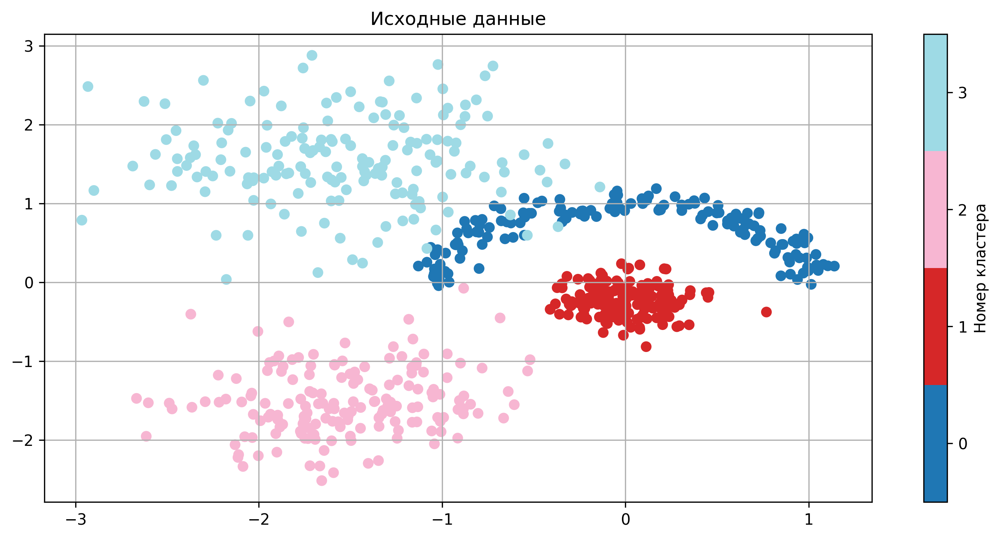

In [ ]:
plot_2d_data(data, labels, title='Исходные данные', cmap='tab20')

#### <font color='DarkOrange'>**Задание 1.a.1 [кросспроверка, 1 балл][код]** </font>
<a id='task_1.a.1'></a>
Запустите следующие алгоритмы кластеризации на данной выборке: `KMeans`, `DBSCAN`, `AgglomerativeClustering`. Визуально подберите наилучшие параметры для этих алгоритмов (`n_clusters`, `eps`, `min_samples`, `linkage`). Изобразите наилучшие получившиеся разбиения на графиках.

<font color='LightSteelBlue'>**Советы**</font>
1. Можете использовать виджеты для ручного подбора параметров
2. Используйте `plot_2d_data` для отрисовки графиков. Обязательно меняйте заголовок
3. **<font color='OrangeRed'>Помните, динамический контент может не сохраняться в ноутбуке. Поэтому после подбора оптимальных параметров нарисуйте соответствующий рисунок в статическом режиме</font>**

In [11]:
# Используем интерактивные графики

# Функция визуализации кластеров
def clustering_viz(method='KMeans', n_clusters=2, eps=0.3,
                   min_samples=5, linkage='ward'):
  if method == 'KMeans':
    model = KMeans(n_clusters=n_clusters, random_state=42)
    labels = model.fit_predict(data)
    title = f'KMeans, n_clusters={n_clusters}'
  elif method == 'DBSCAN':
    model = DBSCAN(eps=eps, min_samples=min_samples)
    labels = model.fit_predict(data)
    title = f'DBSCAN, eps={eps}, min_samples={min_samples}'
  elif method == 'Agglomerative':
    model = AgglomerativeClustering(n_clusters=n_clusters, linkage=linkage)
    labels = model.fit_predict(data)
    title = f'Agglomerative, n_clusters={n_clusters}, linkage={linkage}'
  else:
    labels = np.zeros(data.shape[0])
    title = 'Unknown'

  plot_2d_data(data, labels, title=title)

# Задаем интерфейс для интерактивного использования
interact(
    clustering_viz,
    method=Dropdown(options=['KMeans', 'DBSCAN', 'Agglomerative'], value='KMeans', description='Метод'),
    n_clusters=IntSlider(min=2, max=10, step=1, value=2, description='Кластеры'),
    eps = FloatSlider(min=0.1, max=1.0, step=0.05, value=0.3, description='eps'),
    min_samples=IntSlider(min=2, max=20,step=1, value=5, description='min_samples'),
    linkage=Dropdown(options=['ward', 'complete', 'average', 'single'], value='ward', description='Связь')
);

interactive(children=(Dropdown(description='Метод', options=('KMeans', 'DBSCAN', 'Agglomerative'), value='KMea…

Нарисуем статические графики с подобранными параметрами

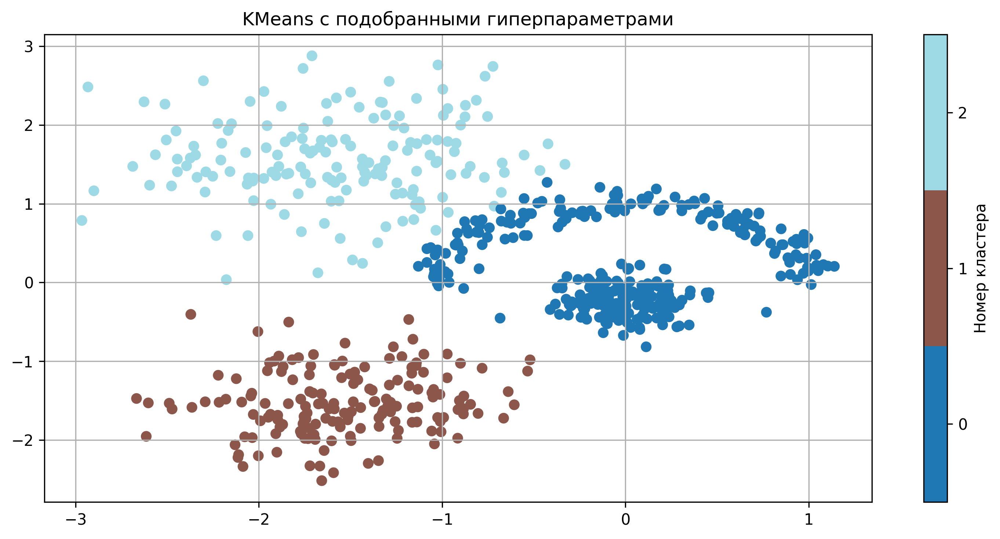

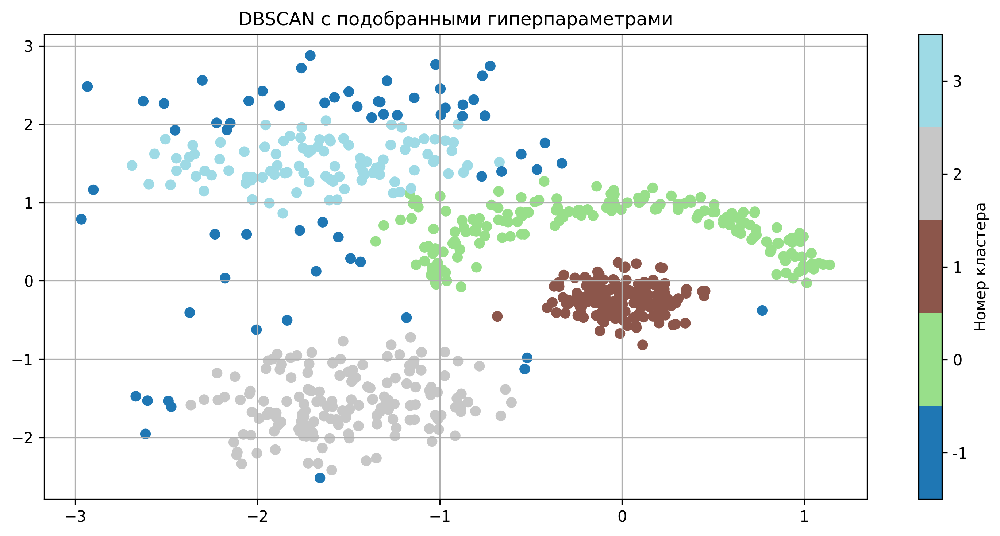

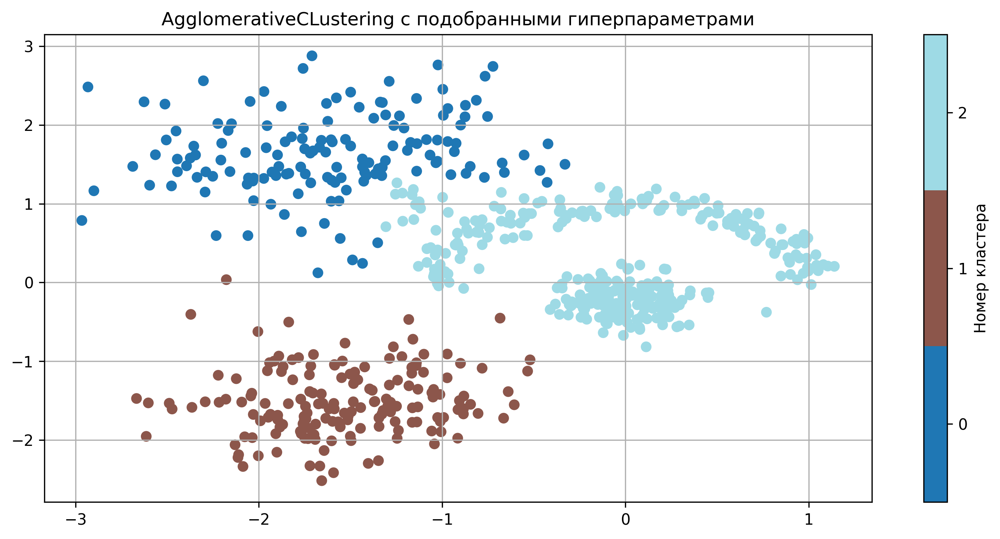

In [16]:
# Статические графики

k_means_best_params = {'n_clusters': 3}
dbscan_best_params = {'eps': 0.3, 'min_samples': 15}
agglomerative_best_params = {'n_clusters': 3, 'linkage': 'average'}

# KMeans
k_means_labels = KMeans(**k_means_best_params, random_state=42, n_init='auto').fit_predict(data)
plot_2d_data(data, k_means_labels, title='KMeans с подобранными гиперпараметрами', cmap='tab20')

# DBSCAN
dbscan_labels = DBSCAN(**dbscan_best_params).fit_predict(data)
plot_2d_data(data, dbscan_labels, title='DBSCAN с подобранными гиперпараметрами', cmap='tab20')

# AgglomerativeClustering
agglomerative_labels = AgglomerativeClustering(**agglomerative_best_params).fit_predict(data)
plot_2d_data(data, agglomerative_labels, title='AgglomerativeCLustering с подобранными гиперпараметрами', cmap='tab20')

#### <font color='DarkOrange'>**Задание 1.a.2 [кросспроверка, 0.5 балла][вопрос]**</font>
Основываясь на знании о работе данных алгоритмов, объясните, почему кластеры были сформированы таким образом. Какой алгоритм лучше всего работает на предложенных данных?

<font color='MediumOrchid'>**Ваш ответ здесь:**</font> (ｏ・_・)ノ”(ノ_<、)

Возможно, моя визуальная оценка субъективна, но после перебора различных значений гиперапараметров я пришел к выводу, что данная релизация алгоритмов самая наилучшая.

Кластеры сформировались таким образом, поскольку:
* ***KMeans*** учитывает расстояния между точками и центроидами. Поэтому кластеры несколько округленные.
* ***DBSCAN*** учитывает плотность точек, то есть те кучи точек, которые находятся рядом с друг другом он объединяет в отдельные кластеры. ***Вот тут честно я сам немного сомневаюсь, поскольку мне не нравится одна точка, которая отделена в кластер, но другие реализации показались мне не очень привлекательными, что можно объяснить тем, что это точка единственная и рядом с ней нет других точек, поэтому он берет ее как отдельную кучу, состоящую из одной точки.***
* ***AgglomerativeClustering*** - работает по принципу "***снизу-вверх***", берет одну точку, берет другую, запихивает их в отдельные кластеры, затем <u>последовательно находит ближайшую пару кластеров и объединяет их в один</u>, и так продолжается до тех пор, пока все точки не будут объединены то или иное количество кластеров. Это и наблюдается на последнем графике.


По моему взгляду, оптимальным образом на кластеры разбил `KMeans`, из визуальных соображений.

Но объективно, `DBSCAN` разделил на кластеры лучше, поскольку еси мы заметим на плотность точек в разных местах, то видно, что плотность точек сильно проявляется, точки, которые ближе к друг другу, они в один кластер закидываются, а вот синие точки, они подальше друг от друга, поэтому они все в одном кластере.

## b. Многомерные данные. Снижение размерности

Теперь попробуем кластеризовать данные в высокоразмерном пространстве. Существенным отличием от двумерного случая является невозможность прямой визуальной оценки кластеризации.

Одним из наглядных способов оценки кластеризации является снижение размерности. В данной части вам предлагается использовать алгоритм `TSNE` для визуализации данных.

<font color='CornflowerBlue'>**t-SNE (t-распределенное стохастическое вложение соседей)**</font> — это алгоритм используемый для сокращения размерности данных, а также для визуализации многомерных данных в 2D или 3D, сохраняя их «структуру». Он фокусируется на том, чтобы близкие точки в исходном пространстве оставались близкими в новом, а далёкие — не обязательно. Для этого t-SNE моделирует сходство между точками в высоком измерении (через условные вероятности) и в низком (через распределение Стьюдента), затем итеративно подгоняет проекции, минимизируя разницу между этими сходствами. В итоге кластеры или локальные паттерны становятся видимыми, но абсолютные расстояния и глобальная структура могут искажаться. Алгоритм полезен для исследования данных, но требует осторожности в интерпретации.

In [64]:
data, labels = make_classification(
    n_samples=1000, n_features=200, n_informative=100,
    n_repeated=0, n_classes=5, n_clusters_per_class=2, weights=None,
    flip_y=0.01, class_sep=2.5, hypercube=True, shift=0.0, scale=1.0,
    shuffle=True, random_state=6417
)

####<font color='DarkOrange'>**Задание 1.b.1 [кросспроверка, 0.5 балла][код, вопрос]**</font>
Примените алгоритм `TSNE` для снижения размерности до двух. Учтите, что `TSNE` суть есть метрический алгоритм и существенно зависит от масштаба признаков — некорректный и различающийся масштаб признаков гарантированно приведёт к неинтерпретируемым результатам. Можете попробовать подобрать гиперпараметры алгоритма для получения лучшей визуализации.

Изобразите получившиеся низкоразмерные вектора. Получилось ли сохранить кластеры при переходе в низкоразмерное пространство?

In [18]:
# Выведем размерность данных
data.shape

(1000, 200)

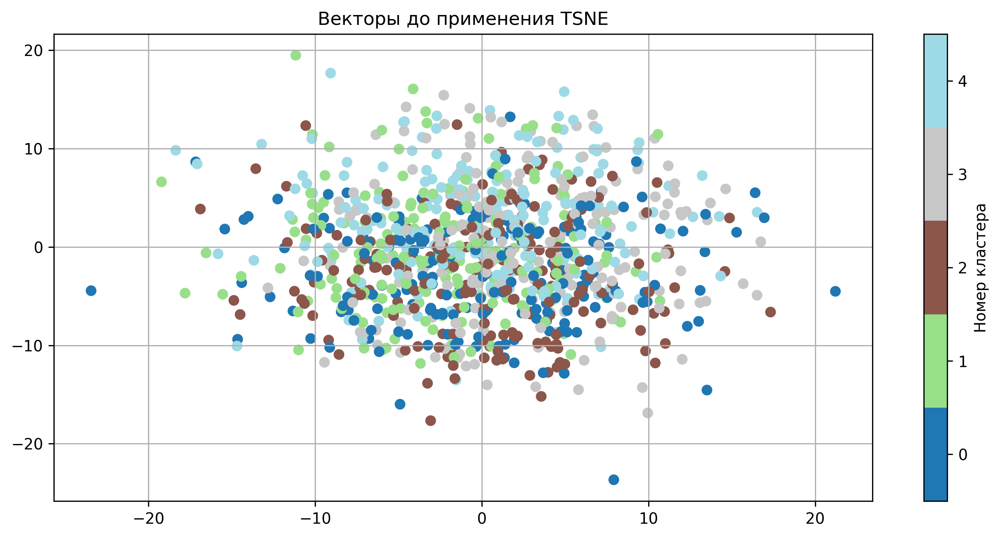

In [66]:
# Посмотрим на вектора до преобразования
plot_2d_data(data, labels, title='Векторы до применения TSNE', cmap='tab20')

In [65]:
# Применяем TSNE
data_embedded = TSNE(n_components=2).fit_transform(data)

# Размерность после преобразования
data_embedded.shape

(1000, 2)

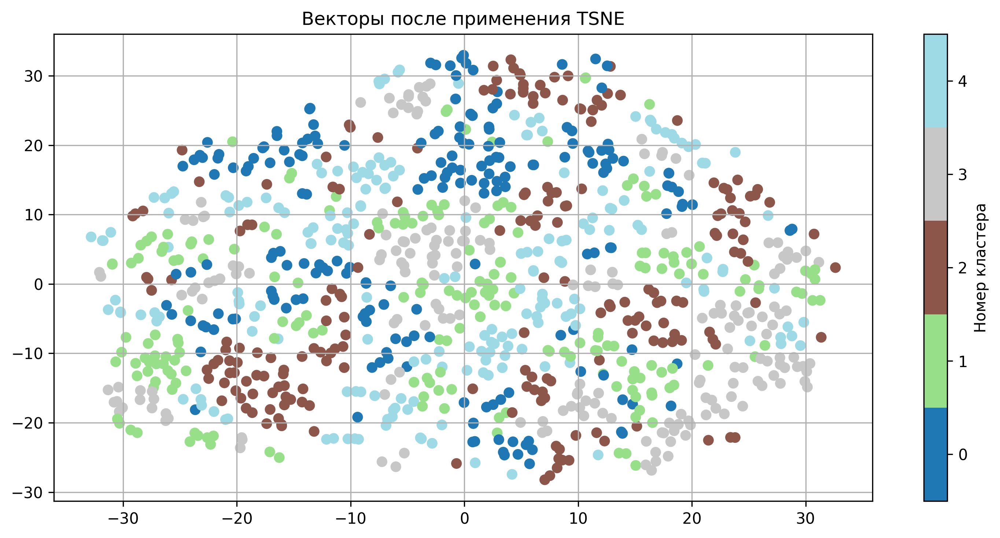

In [67]:
# Визуализация векторов после понижения размерности
plot_2d_data(data_embedded, labels, title='Векторы после применения TSNE', cmap='tab20')

<font color='MediumOrchid'>**Ваш ответ здесь:**</font> (ｏ・_・)ノ”(ノ_<、)

Если внимательно присмотреться, то можно заметить, что <u>структура сама изменилась не сильно</u>, паттерны, которые были у точек до преобразования **TSNE** остались практически той же, но теперь нет выбросов и все кластеры объединены в одном **большом куске**.

#### <font color='DarkOrange'>**Задание 1.b.2 [кросспроверка, 0.5 балла][код]**</font>
Примените алгоритмы кластеризации из предыдущего пункта к новым данным. Изобразите получившиеся кластеры в векторном пространстве, полученном с помощью `TSNE`. Не забудьте подобрать оптимальные параметры (те же, что и в пункте [**1.a.1**](#task_1.a.1)) для всех алгоритмов. Помните, что большинство алгоритмов кластеризации также являются метрическими и существенно зависят от масштаба признаков.

<font color='OrangeRed'>**Замечание:**</font> Обратите внимание, что применять алгоритмы кластеризации нужно к высокоразмерным векторам, а низкоразмерные вектора необходимо использовать только для визуализации.

In [62]:
# Реализуем функцию для высоко размерных данных
# Используем интерактивные графики

# Функция визуализации кластеров
def clustering_high_viz(method='KMeans', n_clusters=2, eps=0.3,
                   min_samples=5, linkage='ward'):
  if method == 'KMeans':
    model = KMeans(n_clusters=n_clusters, random_state=42, n_init='auto')
    labels = model.fit_predict(data)
    title = f'KMeans, n_clusters={n_clusters}'
  elif method == 'DBSCAN':
    model = DBSCAN(eps=eps, min_samples=min_samples)
    labels = model.fit_predict(data)
    title = f'DBSCAN, eps={eps}, min_samples={min_samples}'
  elif method == 'Agglomerative':
    model = AgglomerativeClustering(n_clusters=n_clusters, linkage=linkage)
    labels = model.fit_predict(data)
    title = f'Agglomerative, n_clusters={n_clusters}, linkage={linkage}'
  else:
    labels = np.zeros(data.shape[0])
    title = 'Unknown'

  # Применяем преобразование и визуализируем
  data_scaled = StandardScaler().fit_transform(data)
  data_TSNE = TSNE(n_components=2, perplexity=30).fit_transform(data_scaled)

  plot_2d_data(data_TSNE, labels, title=title)

# Задаем интерфейс для интерактивного использования
interact(
    clustering_high_viz,
    method=Dropdown(options=['KMeans', 'DBSCAN', 'Agglomerative'], value='KMeans', description='Метод'),
    n_clusters=IntSlider(min=2, max=10, step=1, value=2, description='Кластеры'),
    eps = FloatSlider(min=0.1, max=1.0, step=0.05, value=0.3, description='eps'),
    min_samples=IntSlider(min=2, max=20,step=1, value=5, description='min_samples'),
    linkage=Dropdown(options=['ward', 'complete', 'average', 'single'], value='ward', description='Связь')
);

interactive(children=(Dropdown(description='Метод', options=('KMeans', 'DBSCAN', 'Agglomerative'), value='KMea…

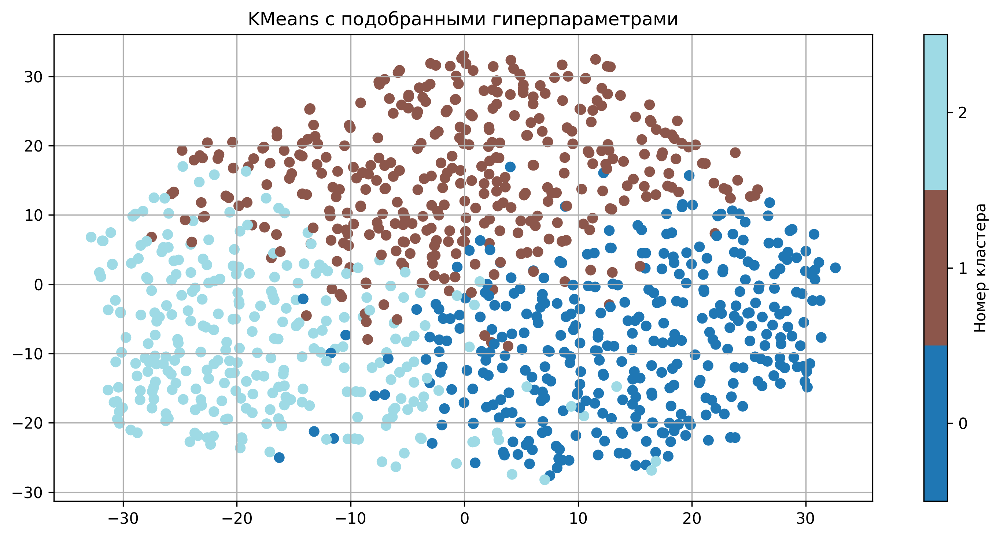

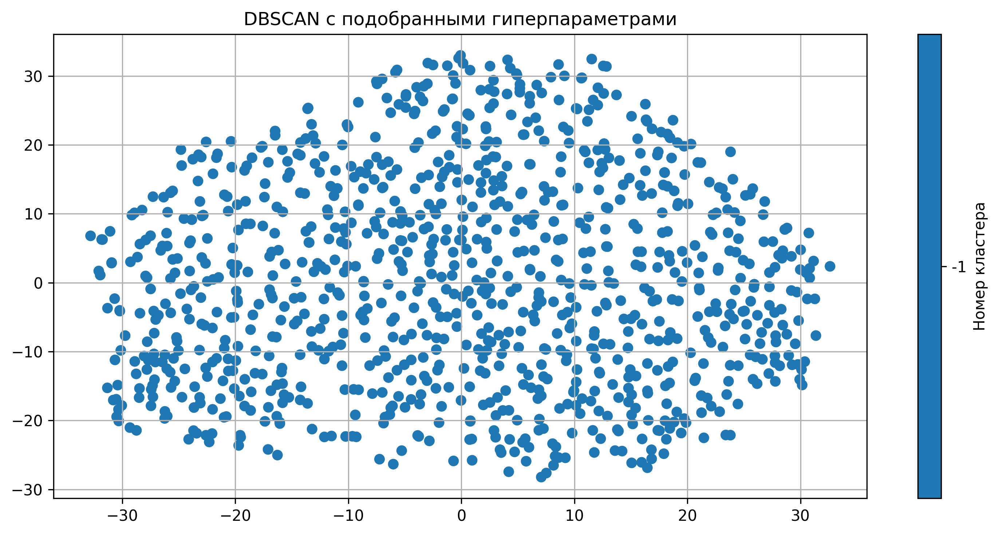

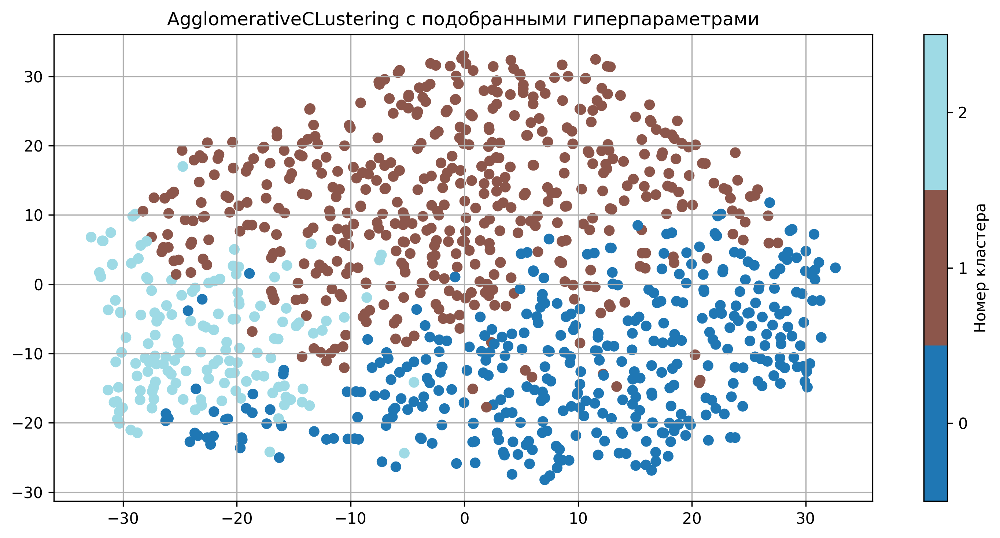

In [68]:
# Лучшие параметры в словари
k_means_best_params = {'n_clusters': 3}
dbscan_best_params = {'eps': 0.1, 'min_samples': 2}
agglomerative_best_params = {'n_clusters': 3, 'linkage': 'ward'}

# KMeans
k_means_labels = KMeans(**k_means_best_params, random_state=42, n_init='auto').fit_predict(data)

# DBSCAN
dbscan_labels = DBSCAN(**dbscan_best_params).fit_predict(data)

# AgglomerativeClustering
agglomerative_labels = AgglomerativeClustering(**agglomerative_best_params).fit_predict(data)

# Визуализируем кластеры после отработки алгрритмов на преобразованных векторах
plot_2d_data(data_embedded, k_means_labels, title='KMeans с подобранными гиперпараметрами', cmap='tab20')
plot_2d_data(data_embedded, dbscan_labels, title='DBSCAN с подобранными гиперпараметрами', cmap='tab20')
plot_2d_data(data_embedded, agglomerative_labels, title='AgglomerativeCLustering с подобранными гиперпараметрами', cmap='tab20')

#### <font color='DarkOrange'>**Задание 1.b.3 [кросспроверка, 0.5 балла][вопрос]**</font>
Опишите получившиеся результаты. Все ли алгоритмы одинаково хорошо разделяют данные? Если какой-то алгоритм не справился с задачей, то предположите почему.

<font color='MediumOrchid'>**Ваш ответ здесь:**</font> (ｏ・_・)ノ”(ノ_<、)

Видно, что каждый алгоритм выдает несколько разный результат. Есть небольшие сходства у `KMeans` и `Agglomerative`, но все таки по визуальной оценке `Agglomerative` выдает лучший результат, чем `KMeans`.

Методика выделения кластеров, а затем их слияние учитывает более лучшую взаимосвящь кластеров, чем расстояние от точек до центроидов.

`DBSCAN` увы печалька((

При подборе любых параметров, он выдает одну и ту же картину, что говорит о том, что он не может подобрать параметры для данной задачи, или он вовсе не применим.

## c. Методы оценки кластеризации. Внутренние и внешние метрики.

Визуальная оценка кластеризации при работе с высокоразмерными данными затруднительна, так как существенно зависит от выбранного метода снижения размерности, который может плохо работать на конкретных данных. С другой стороны, визуальная оценка — субъективна. Поэтому необходимы численные оценки качества кластеризации.

В данном разделе вам нужно будет реализовать две метрики кластеризации и проверить их на практике.

Существует два основных подхода к оценке кластеризации — внутренние и внешние метрики. Первые используют только информацию о векторах-признаках объектов и метки кластеров, полученные из алгоритма кластеризации. Внешние же, используют информацию об истинной разметке объектов.

### Silhouette

Метрика `силуэт` является классическим представителем внутренних метрик кластеризации. Её суть заключается в оценке двух параметров, характеризующих выделенные кластеры — компактность и отделимость.

Положим, что $C_{i}$ — номер кластера для объекта $i$.

$s_{i}$ — компактность кластеризации объекта $i$ определяется как среднее расстояние от него до всех объектов того же кластера:
$$s_{i} = \frac{1}{|\{j : C_{j} = C_{i}\}| - 1} \sum\limits_{j : C_{j} = C_{i}} || x_{i} - x_{j} ||$$

$d_{i}$ — отделимость кластеризации объекта $i$ определяется как среднее расстояние от него до всех объектов второго по близости кластера:
$$ d_{i} = \min_{C: C \neq C_{i}} \frac{1}{|\{j : C_{j} = C\}|} \sum\limits_{j : C_{j} = C} || x_{i} - x_{j} || $$

Тогда силуэт объекта $i$:
$$\text{sil}_{i} = \frac{d_{i} - s_{i}}{\max(d_{i},s_{i})}$$

И, наконец, коэффициент силуэта для выборки определяется как среднее силуэтов объектов:
$$S = \frac{1}{|X|}\sum\limits_{i} \text{sil}_{i}$$

Если кластер состоит из одного объекта, то его силуэт равен нулю.

#### <font color='DarkOrange'>**Задание 1.с.1 [unittests, 2 баллa]**</font>
Реализуйте вычисление коэффициента силуэта для заданного разбиения. Подробная спецификация и описание входных данных к тестам указаны в **описании задания**.

При реализации обратите внимание на следующие пункты:
1. При вычислении не должно возникать warning, бесконечностей и nan-ов
2. Используйте не более одного цикла
3. Учтите, что метки кластеров могут идти не по порядку и принимать произвольные значения
4. Если в данных присутствует один кластер, то считайте что силуэт равен 0
5. Если $s_{i} = d_{i} = 0 \Longrightarrow \text{sil}_{i} = 0$
5. Разрешено использовать `sklearn.metrics.pairwise_distances` и аналоги
6. Запрещено использовать любые библиотечные реализации коэффициента силуэта

**Входные данные тестов удовлетворяют одному из следующих ограничений:**
1. Число объектов $n \le 3000$, размерность пространства $d \le 1200$
2. Число объектов $n \le 5000$, размерность пространства $d = 1$

**Несколько важных замечаний:**

<font color='OrangeRed'>**Замечание:**</font> Запрещается пользоваться библиотеками, импорт которых не объявлен в файле с шаблонами функций.

<font color='OrangeRed'>**Замечание:**</font> Задания, в которых есть решения, содержащие в каком-либо виде взлом тестов, дополнительные импорты и прочие нечестные приемы, будут автоматически оценены в $0$ баллов без права пересдачи задания.

<font color='OrangeRed'>**Замечание:**</font> Под циклами далее подразумеваются как явные Python-циклы (`for`, `while`, list comprehension, ...), так и неявное использование таких циклов внутри библиотек (`np.apply_along_axis` и подобные). В случае возникновения ошибки **Time limit** проверьте код на соответствие числа используемых циклов с требованиями к реализации.

<font color='OrangeRed'>**Замечание:**</font> Для самопроверки доступны как публичные тесты (смотрите **описание задания**), так и тесты внутри Jupyter Notebook

In [24]:
from sklearn.metrics import pairwise_distances

def silhouette_score(x, labels):
    '''
    :param np.ndarray x: Непустой двумерный массив векторов-признаков
    :param np.ndarray labels: Непустой одномерный массив меток объектов
    :return float: Коэффициент силуэта для выборки x с метками labels
    '''

    # Инициализиурем матрицу парных расстояний
    D = pairwise_distances(x)

    # Задаем количество
    num_clusters, count_clusters = np.unique(labels, return_counts=True)
    len_labels = len(labels)

    # Если кластер один то sil = 0
    if len(num_clusters) <= 1:
        return 0

    # Чтобы векторизовать, нужно для каждого sila подсчитать знаменатель
    cluster_in = np.zeros((len_labels, len(num_clusters))).astype(bool)
    sum_dists = np.zeros((len_labels, len(num_clusters)))
    sizes_clusters = np.zeros(len_labels)

    # Один цикл, в котором вычисляем суммы, используя маски, чтобы сделать это векторно,
    # без внутреннего цикла
    for i, cluster in enumerate(num_clusters):
        # Подсчет знаменателя в формуле si и di
        cluster_in[:, i] = labels == cluster
        sum_dists[:, i] = np.sum(D[:, labels == cluster], axis=1)
        sizes_clusters[labels == cluster] = np.sum(labels == cluster)

    # Подсчет si
    one_elem_cl = sizes_clusters == 1
    s = sum_dists[cluster_in]
    s[one_elem_cl] = 0
    s[~one_elem_cl] /= (sizes_clusters[~one_elem_cl] - 1)

    # Рассчет di
    d = np.min(((sum_dists / count_clusters)[~cluster_in]).reshape(len_labels, -1), axis=1)
    # Тот di, у кого кластер где один элемент равен нулю
    d[one_elem_cl] = 0

    # Инициализируем вектор silов
    sil = np.zeros(len_labels)

    # Считаем максимум знаменателя silа
    maxs = np.maximum(s, d)
    np.divide(d - s, maxs, out=sil, where=(maxs != 0))

    return np.mean(sil)

#### <font color='DarkOrange'>**Задание 1.c.2 [кросспроверка, 1 балл][код, вопрос]**</font>
Посчитайте аналитически коэффициенты силуэта для объектов из примера ниже. Посчитайте силуэт аналитически и сравните его с выводом Вашей функции `silhouette_score`.

<font color='OrangeRed'>**Замечание:**</font> Приведите подробные выкладки с использованием $\LaTeX$ (включая значения $s_{i}, d_{i}$). Используйте те же обозначения, что и в теоретической справке выше. Итоговый ответ для силуэта запишите с точностью три знака после запятой.

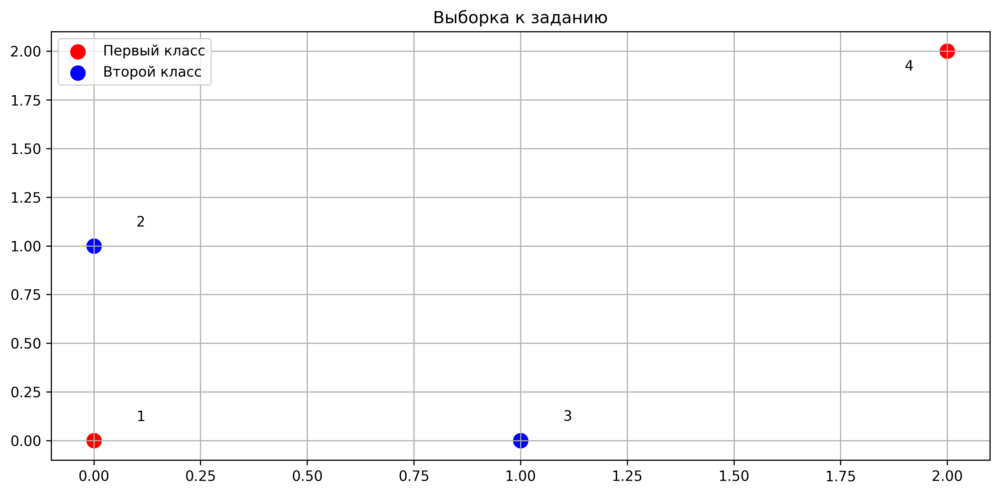

In [25]:
fig, ax = plt.subplots(1, 1, figsize=(10, 5))
ax.scatter([0, 2], [0, 2], s=100, c='r', label='Первый класс')
ax.scatter([0, 1], [1, 0], s=100, c='b', label='Второй класс')

ax.annotate('1', (0.1, 0.1))
ax.annotate('2', (0.1, 1.1))
ax.annotate('3', (1.1, 0.1))
ax.annotate('4', (1.9, 1.9))

ax.set_title('Выборка к заданию')
ax.grid(True)
ax.legend()

fig.tight_layout()
plt.show()

<font color='MediumOrchid'>**Ваш ответ здесь:**</font> (ｏ・_・)ノ”(ノ_<、)

`1 точка`:

$s_1 = \sqrt{(1.9 - 0.1)^2 + (1.9 - 0.1)^2} = \sqrt{3.24 + 3.24} = \sqrt{6.48} \approx 2.545$

$ d_1 = \frac{\sqrt{(0.1-0.1)^2 + (1.1-0.1)^2} + \sqrt{(1.1-0.1)^2 + (0.1-0.1)^2}}{2} = \frac{1+1}{2} = 1$

$sil_1 = \frac{d_1-s_1}{\max(d_1, s_1)} = \frac{1 - 2.545}{2.545} ≈ \boxed{-0.607}$

`2 точка`:

$s_2 = \sqrt{(1.1 - 0.1)^2 + (0.1 - 1.1)^2} = \sqrt{2} \approx 1.414$

$ d_2 = \frac{\sqrt{(0.1-0.1)^2 + (0.1-1.1)^2} + \sqrt{(1.9-0.1)^2 + (1.9-1.1)^2}}{2} = \frac{1 + \sqrt{3.88}}{2} ≈ \frac{1 + 1.97}{2} = 1.485$

$sil_2 = \frac{d_2-s_2}{\max(d_2, s_2)} = \frac{1.485 - 1.414}{1.485} ≈ \boxed{0.048}$

`3 точка`:

Заметим, что ***3 точка*** - это перевернутая **2 точка**. Поэтому делая аналогичные действия, как с ***точкой 2*** получим, что

$sil_3 = sil_2 = \boxed{0.048}$

`4 точка`:

$s_4 = \sqrt{(0.1 - 1.9)^2 + (0.1 - 1.9)^2} = \sqrt{(-1.8)^2 + (-1.8)^2} \approx 2.545$

$ d_4 = \frac{\sqrt{(0.1-1.9)^2 + (1.1-1.9)^2} + \sqrt{(1.1-1.9)^2 + (0.1-1.9)^2}}{2} \approx \frac{1.967 + 1.967}{2} ≈ 1.967$

$sil_4 = \frac{d_4-s_4}{\max(d_4, s_4)} = \frac{1.967 - 2.545}{2.545} = \boxed{-0.227} \implies$

$$\implies \boxed{S = \frac{-0.607 +0.048 + 0.048 - 0.227}{4} = -0.1845 ≈ -0.185}$$



In [26]:
x = np.array([(0.1, 0.1), (0.1, 1.1), (1.1, 0.1), (1.9, 1.9)])
labels = np.array([1, 0, 0, 1])

print(f"Silhouette score by function: {round(silhouette_score(x, labels), 3)}")

Silhouette score by function: -0.185


<a id='task_1.c.1'></a>
Убедитесь, что Ваша реализация проходит минимальные тесты:

In [27]:
assert np.allclose(
    silhouette_score(
        np.array([[0, 0.], [0, 1], [1, 0], [2, 2]]), np.array([1, 0, 0, 1])
    ),
    np.mean([-0.64644661,  0.12596795,  0.12596795, -0.20943058])
)

assert np.allclose(
    silhouette_score(
        np.array([[0, 0.], [0, 1], [1, 0], [2, 2], [1, 1], [2, 0]]), np.array([1, 0, 0, 1, 2, 2])
    ),
    np.mean([-0.64644661,  0.12596795, -0.29289322, -0.39644661, -0.29289322, 0.12596795])
)

print("Ok! :)")

Ok! :)


### B-Cubed

Пусть существует разметка $(y_1, ... , y_l)$, не участвующая в обучении. Мы не использовали эту разметку в качестве дополнительного признака, так как нам не хочется мотивировать модель данным признаком. Тогда предлагается ввести оценку качества алгоритма кластеризации при помощи внешней разметки, саму же разметку тогда называют *gold standard*.

Один из вариантов учесть gold standard разметку — внешняя метрика B-Cubed. Данная метрика позволяет определять следующие особенности кластеризации:
1. **Гомогенность.** Базовое свойство разделения разных объектов в разные кластеры:




2. **Полнота.** Один кластер не должен дробиться на несколько маленьких:



3. **Rag-bag.** Весь мусор должен быть в одном "мусорном"кластере, чтобы остальные кластеры были "чистыми":



4. **Cluster size vs. quantity.** Лучше испортить один кластер с целью улучшить качество множества других:



Пусть $L(x)$ — gold standard, $C(x)$ — номер кластера, выдаваемый рассматриваемым алгоритмом.

Рассмотрим несколько величин:
$$
\text{Correctness}(x, x^{\prime}) = \begin{cases}
1 , C(x) = C(x^{\prime}) ∧ L(x) = L(x^{\prime})\\
0 , иначе
\end{cases}
$$
$$
\text{Precision-BCubed} = \underset{x}{\text{Avg}} \underset{x^{\prime}:C(x)=C(x^{\prime})}{\text{Avg}} \text{Correctness}(x, x^{\prime})
$$
$$
\text{Recall-BCubed} = \underset{x}{\text{Avg}} \underset{x^{\prime}:L(x)=L(x^{\prime})}{\text{Avg}} \text{Correctness}(x, x^{\prime})
$$

Тогда,
$$
\text{B-Cubed} = F_{1} = 2\frac{\text{Precision-BCubed}\times\text{Recall-BCubed}}{\text{Precision-BCubed}+\text{Recall-BCubed}}
$$

#### <font color='DarkOrange'>**Задание 1.с.3 [unittests, 2 баллa]**</font>
Реализуйте вычисление метрики B-Cubed. Подробная спецификация и описание входных данных к тестам указаны в **описании задания**.

При реализации обратите внимание на следующие пункты:
1. При вычислении не должно возникать warning, бесконечностей и nan-ов.
2. Использование циклов запрещено
3. Обратите внимание на параметр `where` у функций-агрегаторов в `numpy` ($numpy \geq 1.20.0$).
4. Запрещено использовать любые библиотечные реализации B-Cubed.

**Входные данные тестов удовлетворяют одному из следующих ограничений:**
1. Число объектов n ⩽ 1000, число подтестов в одном тесте T ⩽ 70

**Несколько важных замечаний:**

<font color='OrangeRed'>**Замечание:**</font> Запрещается пользоваться библиотеками, импорт которых не объявлен в файле с шаблонами функций.

<font color='OrangeRed'>**Замечание:**</font> Задания, в которых есть решения, содержащие в каком-либо виде взлом тестов, дополнительные импорты и прочие нечестные приемы, будут автоматически оценены в $0$ баллов без права пересдачи задания.

<font color='OrangeRed'>**Замечание:**</font> Под циклами далее подразумеваются как явные Python-циклы (`for`, `while`, list comprehension, ...), так и неявное использование таких циклов внутри библиотек (`np.apply_along_axis` и подобные). В случае возникновения ошибки **Time limit** проверьте код на соответствие числа используемых циклов с требованиями к реализации.

<font color='OrangeRed'>**Замечание:**</font> Для самопроверки доступны как публичные тесты (смотрите **описание задания**), так и тесты внутри Jupyter Notebook

In [39]:
def bcubed_score(true_labels, predicted_labels):
    '''
    :param np.ndarray true_labels: Непустой одномерный массив меток объектов
    :param np.ndarray predicted_labels: Непустой одномерный массив меток объектов
    :return float: B-Cubed для объектов с истинными метками true_labels и предсказанными метками predicted_labels
    '''

    # На всякий случай, если на вход подается список или кортеж
    true_labels = np.asarray(true_labels)
    predicted_labels = np.asarray(predicted_labels)
    n = len(true_labels)

    # Вычислим матрицы C и L
    C_eq = predicted_labels[:, None] == predicted_labels[None, :]
    L_eq = true_labels[:, None] == true_labels[None, :]

    # Высчитываем по формуле метрики
    correctness = C_eq & L_eq

    precision = np.sum(correctness, axis=1) / np.sum(C_eq, axis=1)
    recall = np.sum(correctness, axis=1) / np.sum(L_eq, axis=1)

    precision_mean = np.mean(precision)
    recall_mean = np.mean(recall)

    # Корректная обработка знаменателя
    if precision_mean + recall_mean == 0:
        return 0.0
    else:
        return 2 * (precision_mean * recall_mean) / (precision_mean + recall_mean)

<a id='task_1.c.3'></a>
Убедитесь, что Ваша реализация проходит минимальные тесты:

In [40]:
assert np.allclose(bcubed_score(np.array([1]), np.array([1])), 1.0)
assert np.allclose(bcubed_score(np.array([1]), np.array([2])), 1.0)
assert np.allclose(bcubed_score(np.array([1, 2]), np.array([1, 1])), 2. / 3)
assert np.allclose(bcubed_score(np.array([1, 2]), np.array([1, 2])), 1.0)
assert np.allclose(bcubed_score(np.array([1, 2]), np.array([43, 12])), 1.0)
assert np.allclose(bcubed_score(np.array([1, 1, 2, 2]), np.array([1, 1, 1, 2])), 12. / 17)
assert np.allclose(bcubed_score(np.array([1, 2, 3, 4, 5]), np.array([1, 1, 1, 2, 2])), 4. / 7)

print("OK! :)")

OK! :)


#### <font color='DarkOrange'>**Задание 1.с.4 [кросспроверка, 1 балл][код, вопрос]** </font>
<a id='task_1.c.4'></a>
* Для каждого из трёх алгоритмов кластеризации переберите основные параметры (`n_clusters`, `eps`, `min_samples`) и замерьте качество кластеризации многомерных данных с помощью коэффициента силуэта и метрики B-Cubed.
* Для каждого из алгоритмов на одной фигуре изобразите четыре графика — в первой строке два графика с зависимостью коэффициента силуэта и метрики B-Cubed от варьируемого параметра. Во второй строке — визуализация кластеризации с оптимальным параметром, выбранным с помощью первой и второй метрики (можете использовать `plot_2d_data` с параметром `ax`). Для DBSCAN перебирайте оба параметра одновременно и изобразите 2d-heatmap для каждой из метрик. Можете использовать [вспомогательные функции для создания heatmap](https://matplotlib.org/stable/gallery/images_contours_and_fields/image_annotated_heatmap.html).
* Совпали ли оптимальные параметры, определённые по этим метрикам? Совпали ли они с теми параметрами которые вы подобрали в предыдущем задании? Предположите почему они совпали/не совпали.
* Можно ли использовать данные метрики для оценки кластеризации между разными алгоритмами? Какая из них лучше отражает качество?

In [69]:
# Заново сгенерируем для корректной работы
data, labels = make_classification(
    n_samples=1000, n_features=200, n_informative=100,
    n_repeated=0, n_classes=5, n_clusters_per_class=2, weights=None,
    flip_y=0.01, class_sep=2.5, hypercube=True, shift=0.0, scale=1.0,
    shuffle=True, random_state=6417
)

In [70]:
data_scaled = StandardScaler().fit_transform(data)
data_TSNE = TSNE(n_components=2, perplexity=30).fit_transform(data_scaled)

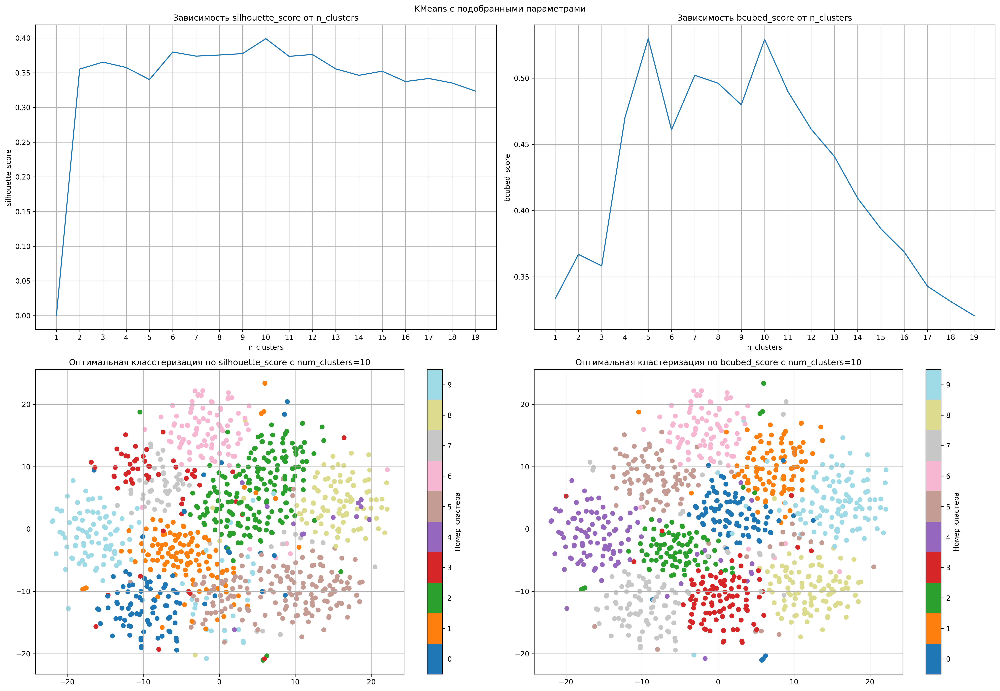

In [71]:
# Перебор гиперпараметров для KMeans

# Подготовим словари для хранения результатов
kmeans_sil_scores = []
kmeans_bcubed_scores = []
kmeans_n_clusters_range = range(1, 20)

for n_clusters in kmeans_n_clusters_range:
    model = KMeans(n_clusters=n_clusters, n_init='auto')
    y_pred = model.fit_predict(data_TSNE)
    sil = silhouette_score(data_TSNE, y_pred)
    bcubed = bcubed_score(labels, y_pred)

    kmeans_sil_scores.append(sil)
    kmeans_bcubed_scores.append(bcubed)

# Оптимальные параметры
best_sil_idx = np.argmax(kmeans_sil_scores)
best_bcubed_idx = np.argmax(kmeans_bcubed_scores)

best_sil_k = kmeans_n_clusters_range[best_sil_idx]
best_bcubed_k = kmeans_n_clusters_range[best_bcubed_idx]

# Построение графиков
fig, ax = plt.subplots(2, 2, figsize=(20, 14))
plt.suptitle("KMeans с подобранными параметрами")

ax[0, 0].plot(kmeans_n_clusters_range, kmeans_sil_scores)
ax[0, 0].set_title('Зависимость silhouette_score от n_clusters')
ax[0, 0].set_xlabel('n_clusters')
ax[0, 0].set_ylabel('silhouette_score')
ax[0, 0].set_xticks(kmeans_n_clusters_range)
ax[0, 0].grid()

ax[0, 1].plot(kmeans_n_clusters_range, kmeans_bcubed_scores)
ax[0, 1].set_title('Зависимость bcubed_score от n_clusters')
ax[0, 1].set_xlabel('n_clusters')
ax[0, 1].set_ylabel('bcubed_score')
ax[0, 1].set_xticks(kmeans_n_clusters_range)
ax[0, 1].grid()

plot_2d_data(data_TSNE, KMeans(n_clusters=10, n_init='auto').fit_predict(data_scaled),
             title=f'Оптимальная класстеризация по silhouette_score с num_clusters={10}', ax=ax[1, 0])
plot_2d_data(data_TSNE, KMeans(n_clusters=10, n_init='auto').fit_predict(data_scaled),
             title=f'Оптимальная кластеризация по bcubed_score с num_clusters={10}', ax=ax[1, 1])

plt.tight_layout()
plt.show()

In [72]:
#DBSCAN
eps = np.linspace(start=13, stop=18, num=20)
min_samples = [n for n in range(1, 21)]

sil_scores = []
bcubed_scores = []
for i, ms in enumerate(min_samples):
    sil_scores.append([])
    bcubed_scores.append([])
    for j in eps:
        sil_scores[i].append(silhouette_score(data_scaled, DBSCAN(eps=j, min_samples=ms).fit_predict(data_scaled)))
        bcubed_scores[i].append(bcubed_score(labels, DBSCAN(eps=j, min_samples=ms).fit_predict(data_scaled)))

In [73]:
def plot_heatmap(data, labels_x, labels_y, ax, bar_text):
    data = np.array(data)
    im = ax.imshow(data)
    ax.set_xticks(np.arange(data.shape[1]), labels=labels_x)
    ax.set_yticks(np.arange(data.shape[0]), labels=labels_y)
    ax.tick_params(top=True, bottom=False, labeltop=True, labelbottom=False)
    cbar = ax.figure.colorbar(im, ax=ax)
    cbar.ax.set_ylabel(bar_text, va="bottom")
    plt.setp(ax.get_xticklabels(), rotation=-90, ha="right")

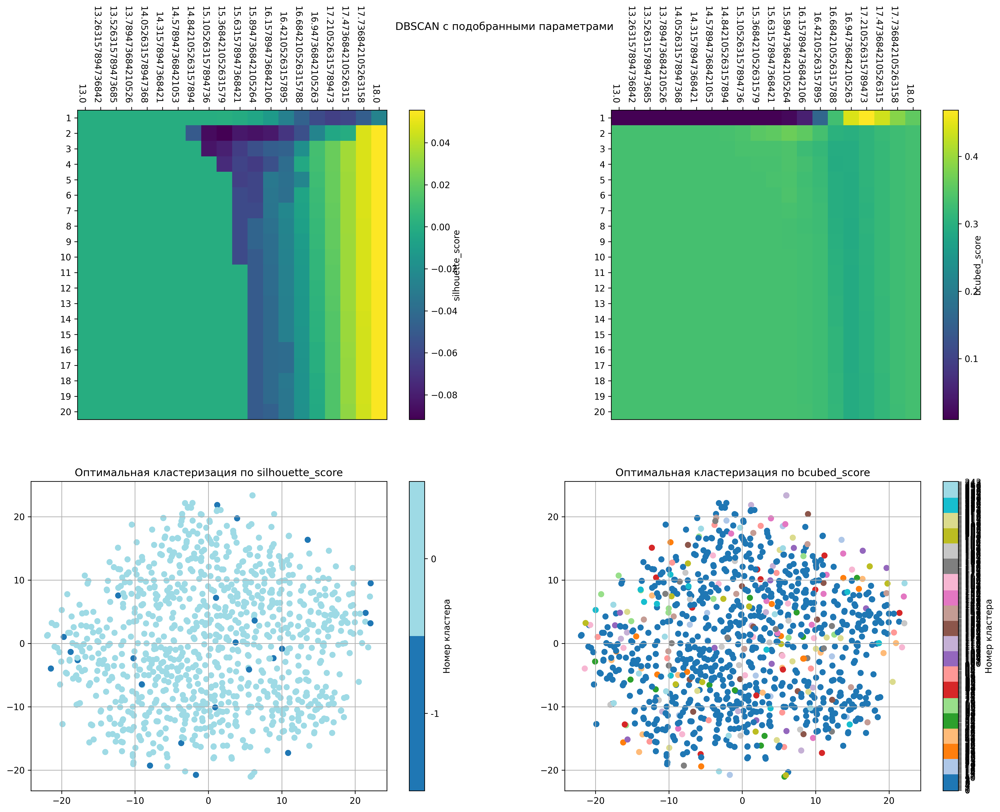

In [74]:
fig, ax = plt.subplots(2, 2, figsize=(20, 14))
plt.suptitle("DBSCAN с подобранными параметрами")

plot_heatmap(sil_scores, eps, min_samples, ax[0, 0], 'silhouette_score')
plot_heatmap(bcubed_scores, eps, min_samples, ax[0, 1], 'bcubed_score')

plot_2d_data(data_TSNE, DBSCAN(eps=18, min_samples=10).fit_predict(data_scaled), title='Оптимальная кластеризация по silhouette_score', ax=ax[1,0])
plot_2d_data(data_TSNE, DBSCAN(eps=17.21, min_samples=1).fit_predict(data_scaled), title='Оптимальная кластеризация по bcubed_score', ax=ax[1,1])
plt.show()

In [75]:
# AgglomerativeClustering
n_clusters = [col for col in range(1, 20)]
sil_scores = []
bcubed_scores = []
for i in n_clusters:
    sil_scores.append(silhouette_score(data_scaled, AgglomerativeClustering(n_clusters=i).fit_predict(data_scaled)))
    bcubed_scores.append(bcubed_score(labels, AgglomerativeClustering(n_clusters=i).fit_predict(data_scaled)))

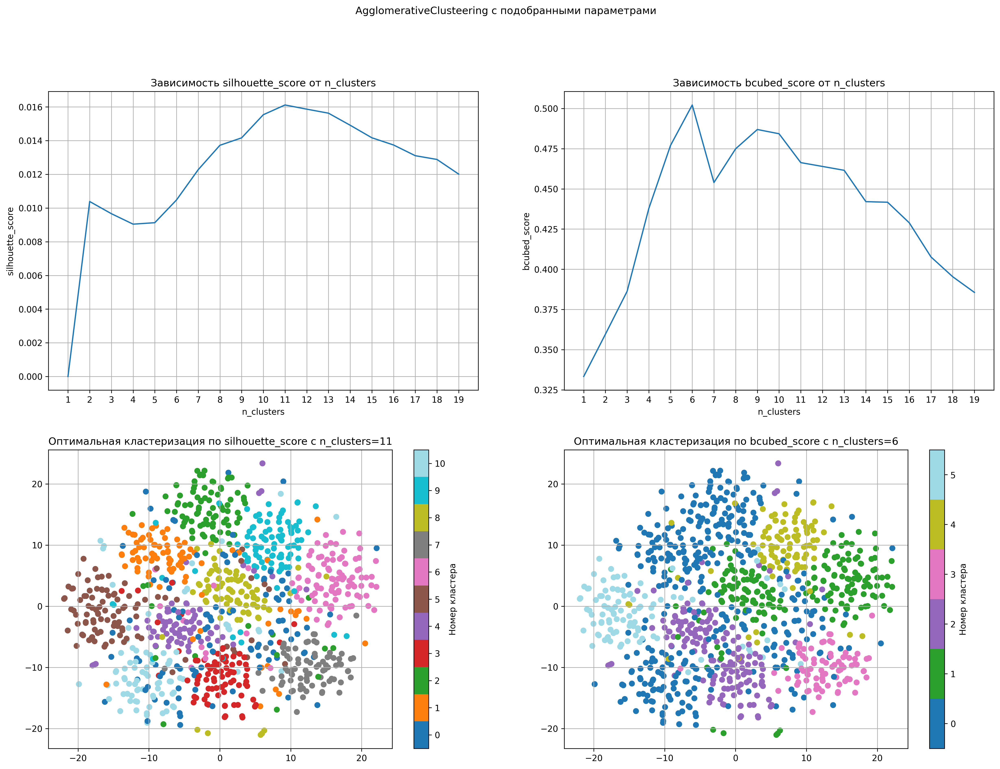

In [76]:
fig, ax = plt.subplots(2, 2, figsize=(20, 14))
plt.suptitle("AgglomerativeClusteering с подобранными параметрами")

ax[0, 0].plot(n_clusters, sil_scores)
ax[0, 0].set_title('Зависимость silhouette_score от n_clusters')
ax[0, 0].set_xlabel('n_clusters')
ax[0, 0].set_ylabel('silhouette_score')
ax[0, 0].set_xticks(n_clusters)
ax[0, 0].grid()

ax[0, 1].plot(n_clusters, bcubed_scores)
ax[0, 1].set_title('Зависимость bcubed_score от n_clusters')
ax[0, 1].set_xlabel('n_clusters')
ax[0, 1].set_ylabel('bcubed_score')
ax[0, 1].set_xticks(n_clusters)
ax[0, 1].grid()

plot_2d_data(data_TSNE, AgglomerativeClustering(n_clusters=11).fit_predict(data_scaled),
             title=f'Оптимальная кластеризация по silhouette_score с n_clusters={11}', ax=ax[1,0])
plot_2d_data(data_TSNE, AgglomerativeClustering(n_clusters=6).fit_predict(data_scaled),
             title=f'Оптимальная кластеризация по bcubed_score с n_clusters={6}', ax=ax[1,1])

plt.show()

<font color='MediumOrchid'>**Ваш ответ здесь:**</font> (ｏ・_・)ノ”(ノ_<、)

1. В случае `KMeans` число кластеров оказалось одинаковым, а вот в случае двух других параметры отличные. По сравнению с подобранными параметрами в предыдущем задании есть большие отличия. Все таки <u>**метрика позволяет учитывать конкретные паттерны в данных**</u>, чем если бы мы смотрели визуально на кластеры, поскольку в зависимости от задачи мы можем получать неинтерпретирующие результаты, и поэтому <u>визуальная оценка может оказаться ***субъективной***</u>, в то время, как <u>оценка по метрике дает проверенный результат</u>.

2. В принципе я думаю, что **данные метрики** использовать можно(а какие тогда использовать? (:, пошучу), поскольку все таки разные модели работают по разному и **визуально всегда можно оценить по кластерам** какая модель лучше всего это сделала, а метрика уже покажет точное число - качество кластеризации. Если говорить про какую из них использовать, то я бы предпочел $B-Cubed$, из того как я вижу фомирование кластеров и графика изменения качества. Но, опять же, если визуализация не дает четкой интерпретации, то метрика как по мне, это единственный выход.

## <font color='MediumSeaGreen'> **Задание 2 [Bonus][1 балл]** </font>



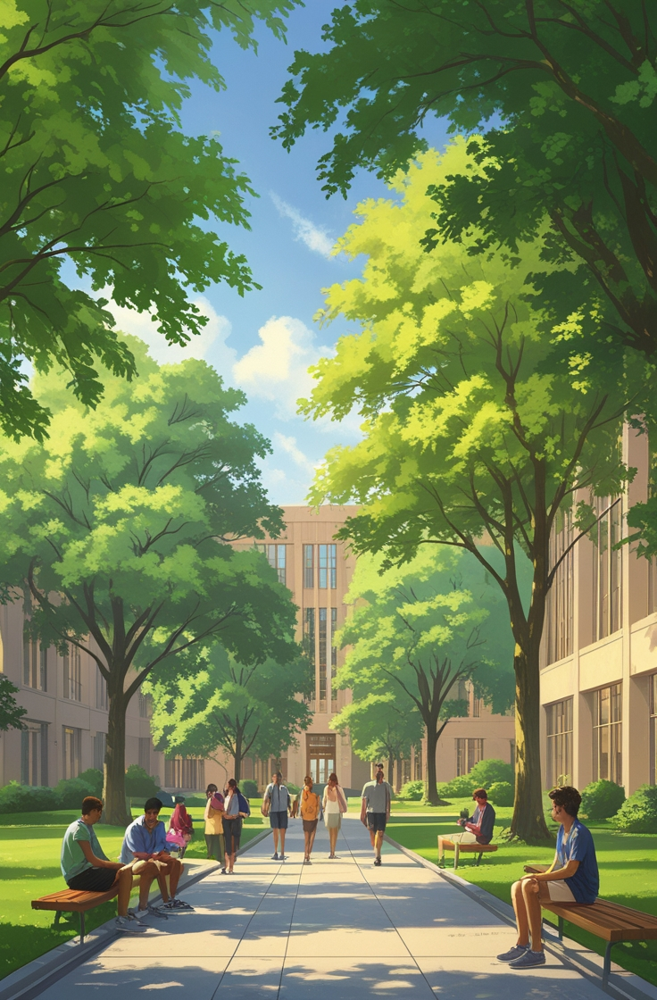

Подкиньте друг другу 3+ идеи, куда сходить/чем заняться на майских :)

Или вставьте/сгенерируйте любой смешной мем на тему весны/лета

![Весна](https://risovach.ru/thumb/upload/200s400/2014/02/mem/vesna_43252430_orig_.jpeg?5o0j1)

![Весна, епты](https://s00.yaplakal.com/pics/pics_original/0/4/5/1787540.jpg)

![Вилли Вонка](https://avatars.mds.yandex.net/i?id=f2288c4c3bcc8a12e689be2a4eca0f3cceec8894-4877628-images-thumbs&n=13)

На майских:

1.   На шашлыки в лес с братвой.
2.   К семье, а семьей куда нибудь по красивым местам.
3.   САМОЕ ГЛАВНОЕ: ТУУУУУУУССССИИИИИИТТТЬЬЬ :)

In [ ]:
gdown.download(id='16UgWo1Emt9ar1O4h2Xxed0ZpJZ0OG5V-', output='cifar10_deep_features.npy')

Downloading...
From (original): https://drive.google.com/uc?id=16UgWo1Emt9ar1O4h2Xxed0ZpJZ0OG5V-
From (redirected): https://drive.google.com/uc?id=16UgWo1Emt9ar1O4h2Xxed0ZpJZ0OG5V-&confirm=t&uuid=251af952-6e92-4e74-b820-b3fbc3c725d6
To: /content/cifar10_deep_features.npy
100%|██████████| 164M/164M [00:01<00:00, 94.7MB/s]


'cifar10_deep_features.npy'